# Modal Beamforming on an open circular array

Compute the plane wave decomposition for an incident broadband plane wave on an open circular array using a modal beamformer of finite order.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import micarray

from micarray.util import db

In [2]:
Nsf = 50  # order of the incident sound field
N = 30  # order of modal beamformer/microphone array
pw_angle = 1.23 * np.pi  # incidence angle of plane wave
pol_pwd = np.linspace(0, 2*np.pi, 180, endpoint=False)  # angles for plane wave decomposition
k = np.linspace(0, 20, 100)  # wavenumber vector
r = 1  # radius of array

get uniform grid (microphone positions) of order N


In [3]:
pol, weights = micarray.modal.angular.grid_equal_polar_angle(N)

pressure on the surface of an open cylinder for an incident plane wave

In [4]:
Bn = micarray.modal.radial.circular_pw(Nsf, k, r, setup='open')
D = micarray.modal.radial.circ_diagonal_mode_mat(Bn)
Psi_p = micarray.modal.angular.cht_matrix(Nsf, pol)
Psi_pw = micarray.modal.angular.cht_matrix(Nsf, pw_angle)
p = np.matmul(np.matmul(Psi_p, D), np.conj(Psi_pw.T))
p = np.squeeze(p)

# incident plane wave exhibiting infinite spatial bandwidth
# p = np.exp(1j * k[:, np.newaxis]*r * np.cos(pol - pw_angle))

plane wave decomposition using modal beamforming

In [5]:
Bn = micarray.modal.radial.circular_pw(N, k, r, setup='open')
Dn, _ = micarray.modal.radial.regularize(1/Bn, 3000, 'softclip')
D = micarray.modal.radial.circ_diagonal_mode_mat(Dn)
Psi_p = micarray.modal.angular.cht_matrix(N, pol, weights)
Psi_q = micarray.modal.angular.cht_matrix(N, pol_pwd)
A_pwd = np.matmul(np.matmul(Psi_q, D), np.conj(Psi_p.T))
q_pwd = np.squeeze(np.matmul(A_pwd, np.expand_dims(p, 2)))
q_pwd_t = np.fft.fftshift(np.fft.irfft(q_pwd, axis=0), axes=0)

visualize plane wave decomposition (aka beampattern)

Text(0.5, 1.0, 'Plane wave docomposition by modal beamformer (frequency domain)')

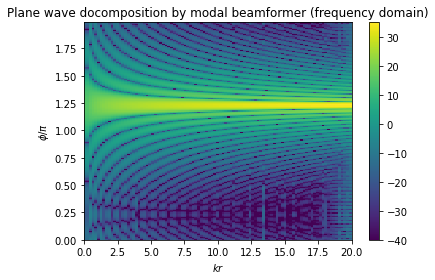

In [6]:
plt.figure()
plt.pcolormesh(k, pol_pwd/np.pi, db(q_pwd.T), vmin=-40)
plt.colorbar()
plt.xlabel(r'$kr$')
plt.ylabel(r'$\phi / \pi$')
plt.title('Plane wave docomposition by modal beamformer (frequency domain)')

Text(0.5, 1.0, 'Plane wave docomposition by modal beamformer (time domain)')

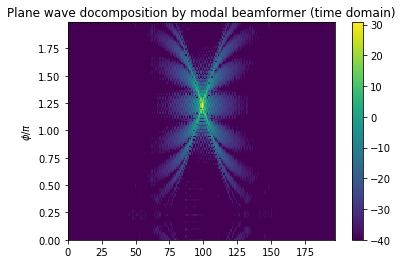

In [7]:
plt.figure()
plt.pcolormesh(range(2*len(k)-2), pol_pwd/np.pi, db(q_pwd_t.T), vmin=-40)
plt.colorbar()
plt.ylabel(r'$\phi / \pi$')
plt.title('Plane wave docomposition by modal beamformer (time domain)')